
## Problem Statement: Concrete Strength Prediction
### Submitted by Kingshuk Banerjee


### Objective 

#### To predict the concrete strength using the data available in file "concrete.csv". 
#### Apply feature engineering and model tuning to obtain score above 85%.


### Resources Available 

#### The data for this project is available in file https://archive.ics.uci.edu/ml/machine-learning-databases/concrete/compressive/. 
#### The same has been shared along with the course content.

 

### Steps and Tasks:

#### Exploratory Data Quality Report Reflecting the Following:

#### Univariate analysis –data types and description of the independent attributes which should include (name, range of values observed central values (mean and median), standard deviation and quartiles, analysis of the body of distributions/tails, missing values, outliers
duplicates(10 Marks)

#### Bi-variate analysis between the predictor variables and between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Visualize the analysis using boxplots and pair plots, histograms, or density curves. (10 marks)

#### Feature Engineering techniques(10 marks)
#### Identify opportunities (if any) to extract new features from existing features, drop a feature(if required) Hint: Feature Extraction, for example, consider a dataset with two features length and breadth. From this, we can extract a new feature Area which would be length * breadth.

#### Get the data model ready and do a train test split.

#### Decide on the complexity of the model, should it be a simple linear model in terms of parameters or would a quadratic or higher degree.
 

### Creating the Model and Tuning It:

#### Algorithms that you think will be suitable for this project. Use Kfold Cross-Validation to evaluate model performance. Use appropriate metrics and make a DataFrame to compare models w.r.t their metrics. (at least 3 algorithms, one bagging and one boosting based algorithms have to be there). (15 marks)

#### Techniques employed to squeeze that extra performance out of the model without making it overfit. Use Grid Search or Random Search on any of the two models used above. Make a DataFrame to compare models after hyperparameter tuning and their metrics as above. (15 marks)
 

#### Attribute Information:

#### Given are the variable name, variable type, the measurement unit, and a brief description. The concrete compressive strength is the
regression problem. The order of this listing corresponds to the order of numerals along the rows of the database.

 
### Name	Data Type	Measurement	Description
#### 1.	Cement (cement)	quantitative	kg in a m3 mixture	Input Variable
#### 2.	Blast Furnace Slag (slag)	quantitative	kg in a m3 mixture	Input Variable
#### 3.	Fly Ash (ash)	quantitative	kg in a m3 mixture	Input Variable
#### 4.	Water(water)	quantitative	kg in a m3 mixture	Input Variable
#### 5.	Superplasticizer (superplastic)	quantitative	kg in a m3 mixture	Input Variable
#### 6.	Coarse Aggregate (coarseagg)	quantitative	kg in a m3 mixture	Input Variable
#### 7.	Fine Aggregate (fineagg)	quantitative	kg in a m3 mixture	Input Variable
#### 8.	Age(age)	quantitative	Day (1~365)	Input Variable
#### 9.	Concrete compressive strength(strength)	quantitative	MPa	Output Variable


In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df = pd.read_csv('concrete.csv')
df.head(10)

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29
5,255.0,0.0,0.0,192.0,0.0,889.8,945.0,90,21.86
6,166.8,250.2,0.0,203.5,0.0,975.6,692.6,7,15.75
7,251.4,0.0,118.3,188.5,6.4,1028.4,757.7,56,36.64
8,296.0,0.0,0.0,192.0,0.0,1085.0,765.0,28,21.65
9,155.0,184.0,143.0,194.0,9.0,880.0,699.0,28,28.99


In [3]:
df.shape

(1030, 9)

## Univariate Analysis 
### – data types and description of the independent attributes which should include (name, range of values observed, central values (mean and median), standard deviation and quartiles, analysis of the body of distributions/tails, missing values, outliers, duplicates(10 Marks)

In [4]:
df.dtypes

cement          float64
slag            float64
ash             float64
water           float64
superplastic    float64
coarseagg       float64
fineagg         float64
age               int64
strength        float64
dtype: object

### Observation
### The data types are all float or int. This is okay and may only need scaling.

In [5]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cement,1030.0,281.167864,104.506364,102.00,192.375,272.900,350.000,540.0
slag,1030.0,73.895825,86.279342,0.00,0.000,22.000,142.950,359.4
ash,1030.0,54.188350,63.997004,0.00,0.000,0.000,118.300,200.1
water,1030.0,181.567282,21.354219,121.80,164.900,185.000,192.000,247.0
superplastic,1030.0,6.204660,5.973841,0.00,0.000,6.400,10.200,32.2
coarseagg,1030.0,972.918932,77.753954,801.00,932.000,968.000,1029.400,1145.0
fineagg,1030.0,773.580485,80.175980,594.00,730.950,779.500,824.000,992.6
age,1030.0,45.662136,63.169912,1.00,7.000,28.000,56.000,365.0
strength,1030.0,35.817961,16.705742,2.33,23.710,34.445,46.135,82.6


### Observation
#### The slag, ash and superplastic seem to have skewed distribution and missing values (0.0)
#### The range of age seems to be from 1-day to 1-year, in between there are durations for week (7d), month (28d) or two (56d).
#### The range of numbers are all different, so scaling is mandatory. 

In [6]:
df.skew()

cement          0.509481
slag            0.800717
ash             0.537354
water           0.074628
superplastic    0.907203
coarseagg      -0.040220
fineagg        -0.253010
age             3.269177
strength        0.416977
dtype: float64

### Observation
#### Except for water and coarseagg, others have significant skews.

In [7]:
df.isna().sum()

cement          0
slag            0
ash             0
water           0
superplastic    0
coarseagg       0
fineagg         0
age             0
strength        0
dtype: int64

In [8]:
(df < 0.0).sum()

cement          0
slag            0
ash             0
water           0
superplastic    0
coarseagg       0
fineagg         0
age             0
strength        0
dtype: int64

### Observation - No negative values or Nan, indicating a clean dataset.

In [9]:
(df == 0.0).sum()

cement            0
slag            471
ash             566
water             0
superplastic    379
coarseagg         0
fineagg           0
age               0
strength          0
dtype: int64

### Observation: 
#### The slag, ash and superplastic are 0 in lot of samples. 
#### This may be okay since these are additives to the concrete mixture. 
#### If cement, water or age would have been 0, that would have meant missing data.

In [10]:
print(df[df.duplicated() == True].shape)
df[df.duplicated() == True]

(25, 9)


,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
278,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
298,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
400,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
420,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
463,362.6,189.0,0.0,164.9,11.6,944.7,755.8,56,77.30
468,252.0,0.0,0.0,185.0,0.0,1111.0,784.0,28,19.69
482,425.0,106.3,0.0,153.5,16.5,852.1,887.1,91,65.20
493,362.6,189.0,0.0,164.9,11.6,944.7,755.8,91,79.30
517,425.0,106.3,0.0,153.5,16.5,852.1,887.1,56,64.30
525,362.6,189.0,0.0,164.9,11.6,944.7,755.8,28,71.30


### Observation:
#### There are 25 duplicate data rows
#### We will drop these duplicate rows below

In [11]:
df_copy = df.copy()
df.drop_duplicates(inplace=True)
print(df.shape)
df[df.duplicated() == True]

(1005, 9)


,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength


&lt;matplotlib.axes._subplots.AxesSubplot at 0x1216cd390&gt;

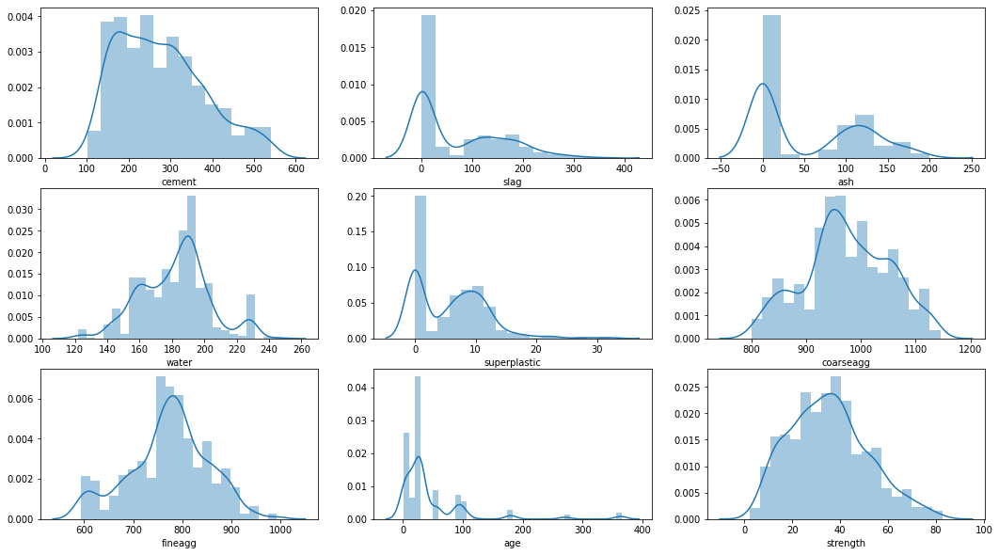

In [13]:
fig, axes = plt.subplots(3, 3, figsize=(18, 10))
sns.distplot(df['cement'], ax=axes[0,0])
sns.distplot(df['slag'],ax=axes[0,1])
sns.distplot(df['ash'], ax=axes[0,2])
sns.distplot(df['water'], ax=axes[1,0])
sns.distplot(df['superplastic'], ax=axes[1,1])
sns.distplot(df['coarseagg'], ax=axes[1,2])
sns.distplot(df['fineagg'], ax=axes[2,0])
sns.distplot(df['age'], ax=axes[2,1])
sns.distplot(df['strength'], ax=axes[2,2])

&lt;matplotlib.axes._subplots.AxesSubplot at 0x121bbcf98&gt;

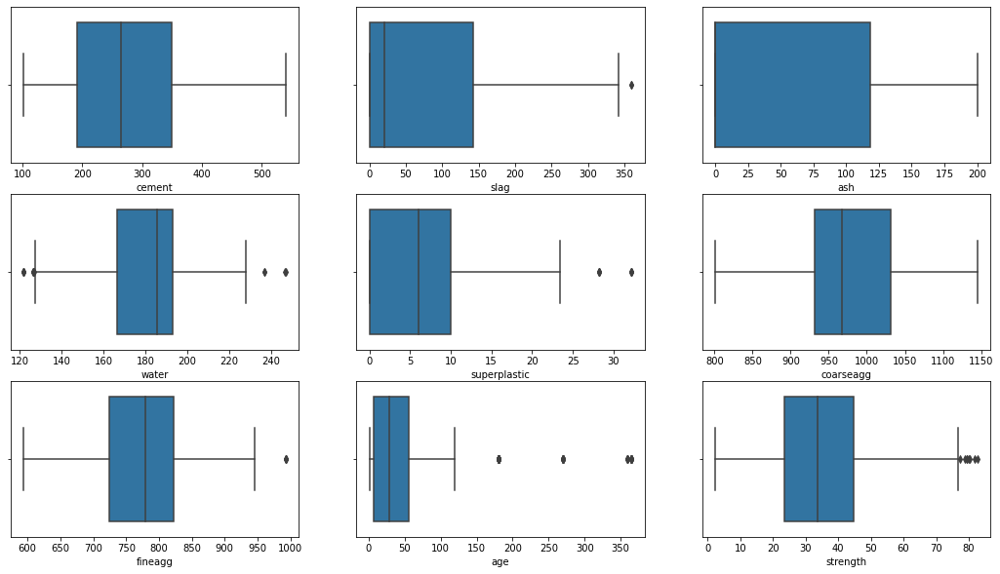

In [14]:
fig, axes = plt.subplots(3, 3, figsize=(18, 10))
sns.boxplot(df['cement'], ax=axes[0,0])
sns.boxplot(df['slag'],ax=axes[0,1])
sns.boxplot(df['ash'], ax=axes[0,2])
sns.boxplot(df['water'], ax=axes[1,0])
sns.boxplot(df['superplastic'], ax=axes[1,1])
sns.boxplot(df['coarseagg'], ax=axes[1,2])
sns.boxplot(df['fineagg'], ax=axes[2,0])
sns.boxplot(df['age'], ax=axes[2,1])
sns.boxplot(df['strength'], ax=axes[2,2])

### Observation
#### From the distplots, the data is not exactly Gaussian. May need some transforms.
#### There are not many outliers except age, which is okay since age may be more or less discrete. 
#### Age can be binned but if we scale using MinMaxScaler and use non-linear algorithms, its effect can be modeled.

## Bi-variate analysis between the predictor variables and between the predictor variables and target column. 
### Comment on your findings in terms of their relationship and degree of relation if any. Visualize the analysis using boxplots and pair plots, histograms, or density curves. (10 marks)
### check the correlations and pairwise plots

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
cement,1.000000,-0.303324,-0.385610,-0.056625,0.060906,-0.086205,-0.245375,0.086348,0.488283
slag,-0.303324,1.000000,-0.312352,0.130262,0.019800,-0.277559,-0.289685,-0.042759,0.103374
ash,-0.385610,-0.312352,1.000000,-0.283314,0.414213,-0.026468,0.090262,-0.158940,-0.080648
water,-0.056625,0.130262,-0.283314,1.000000,-0.646946,-0.212480,-0.444915,0.279284,-0.269624
superplastic,0.060906,0.019800,0.414213,-0.646946,1.000000,-0.241721,0.207993,-0.194076,0.344209
coarseagg,-0.086205,-0.277559,-0.026468,-0.212480,-0.241721,1.000000,-0.162187,-0.005264,-0.144717
fineagg,-0.245375,-0.289685,0.090262,-0.444915,0.207993,-0.162187,1.000000,-0.156572,-0.186448
age,0.086348,-0.042759,-0.158940,0.279284,-0.194076,-0.005264,-0.156572,1.000000,0.337367
strength,0.488283,0.103374,-0.080648,-0.269624,0.344209,-0.144717,-0.186448,0.337367,1.000000


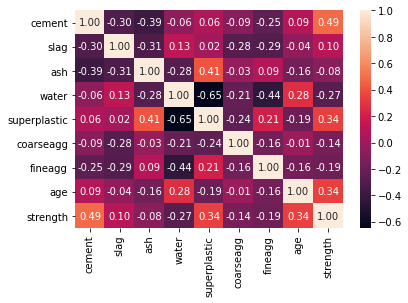

In [15]:
corr = df.corr()
sns.heatmap(corr, annot=True, fmt='.2f')
corr

### Observation
#### There is no significant correlation observed between the variables. 

&lt;seaborn.axisgrid.PairGrid at 0x1216387f0&gt;

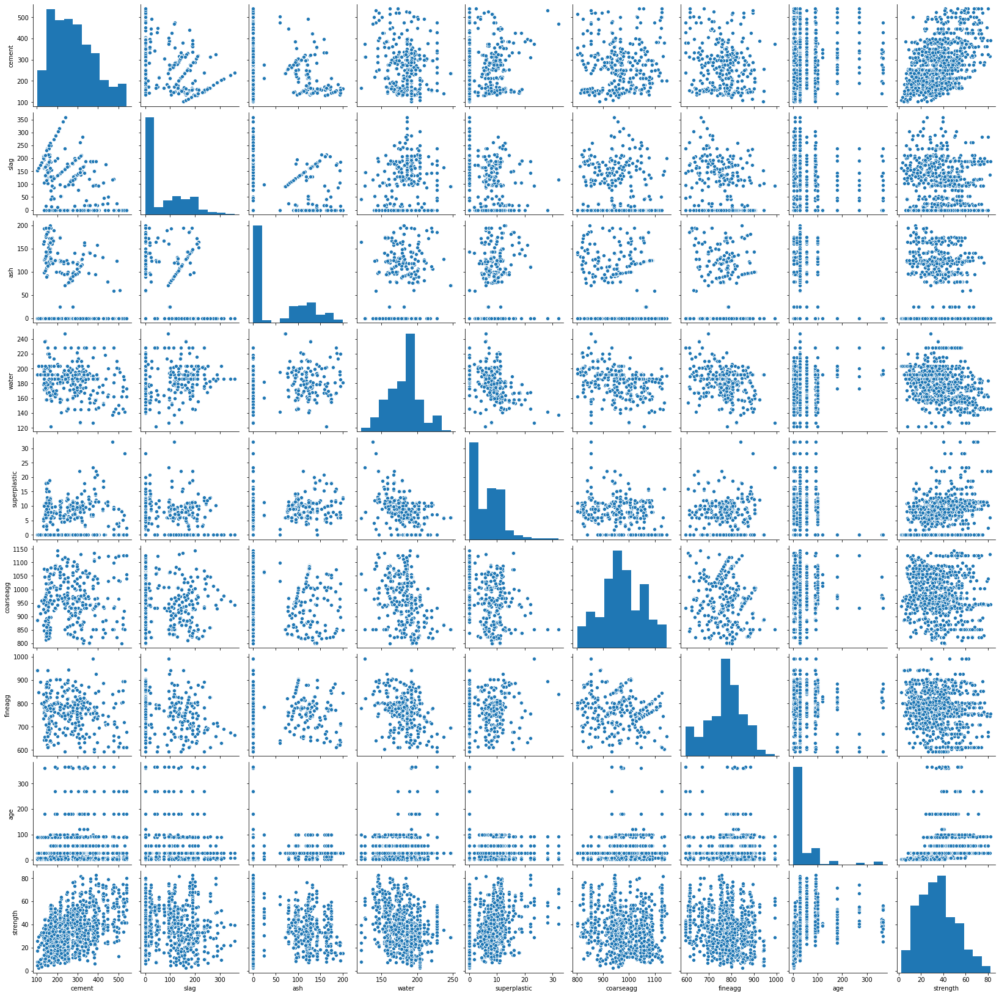

In [16]:
sns.pairplot(df)

### Observation
#### Cement and strength, water and superplastic show some weak correlation.
#### The age variable seems to have discretized bands of values. 

## Bivariate analysis with respect to the target variable

In [17]:
df.nunique()

cement          278
slag            185
ash             156
water           195
superplastic    111
coarseagg       284
fineagg         302
age              14
strength        845
dtype: int64

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123483780&gt;

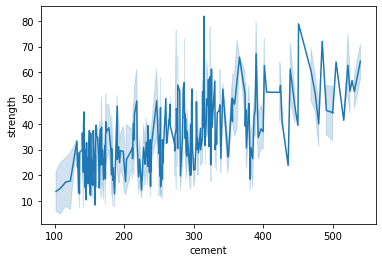

In [18]:
sns.lineplot(data=df, x='cement', y='strength')

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123c14438&gt;

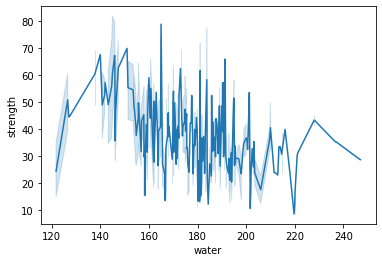

In [19]:
sns.lineplot(data=df, x='water', y='strength')

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123c209b0&gt;

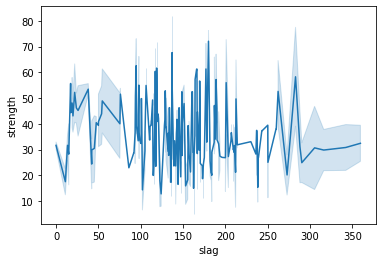

In [20]:
sns.lineplot(data=df, x='slag', y='strength')

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123cdfe80&gt;

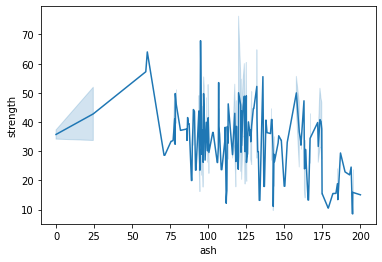

In [21]:
sns.lineplot(data=df, x='ash', y='strength')

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123d296d8&gt;

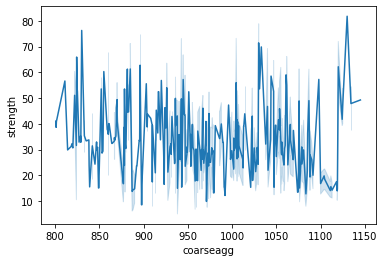

In [22]:
sns.lineplot(data=df, x='coarseagg', y='strength')

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123dcb668&gt;

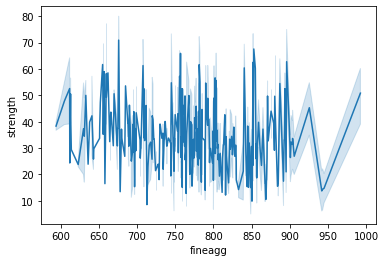

In [23]:
sns.lineplot(data=df, x='fineagg', y='strength')

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123d9b0b8&gt;

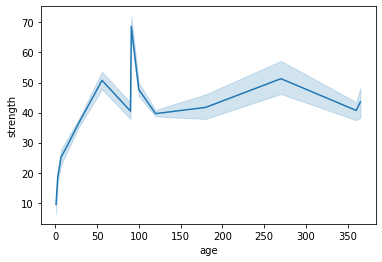

In [24]:
sns.lineplot(data=df, x='age', y='strength')

&lt;matplotlib.axes._subplots.AxesSubplot at 0x123db8eb8&gt;

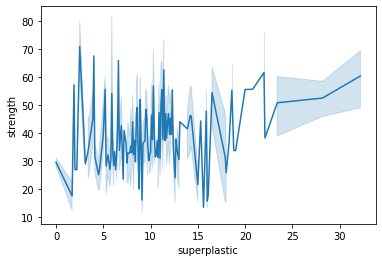

In [25]:
sns.lineplot(data=df, x='superplastic', y='strength')

### Observation: 
#### coarseagg and fineagg seem to have a random relationship to the strength. 
#### Others seem to have some correlation as part of the lineplot shows monotonic relationship. 
#### age, cement, water, superplastic, slag and ash seems to be the good predictors. 
#### We will confirm this from the model's feature importances.

## Develop few models with algorithms by scaling the data and measuring the score.

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline

In [27]:
modelTuples = (('LR', LinearRegression()),
              ('SVR', SVR()),
              ('RFR', RandomForestRegressor(random_state=1)),
              ('BAGR', BaggingRegressor(random_state=1)),
              ('XGR', XGBRegressor(random_state=1))
            )
val_scores = dict()
for model in modelTuples:
    #print(model)
    (n,m) = model
    pipe = Pipeline([('scaler', MinMaxScaler()), (n,m)])
    val_scores[n] = cross_val_score(pipe, df.drop('strength', axis=1), df['strength'], cv=10, n_jobs=None)
print(val_scores)


{&#39;LR&#39;: array([0.46628586, 0.6752301 , 0.71634847, 0.56975716, 0.53400846,
       0.65188429, 0.6233933 , 0.52981652, 0.46605527, 0.53742147]), &#39;SVR&#39;: array([0.60498496, 0.62970883, 0.69377245, 0.58214074, 0.51281674,
       0.59861853, 0.62271973, 0.56316985, 0.52020524, 0.56854948]), &#39;RFR&#39;: array([0.84680848, 0.89267879, 0.95255077, 0.91685201, 0.87530184,
       0.92802752, 0.93525576, 0.90249577, 0.91705913, 0.92562121]), &#39;BAGR&#39;: array([0.82861799, 0.8598248 , 0.94753631, 0.91376139, 0.8679595 ,
       0.92182973, 0.93104449, 0.88757949, 0.8921893 , 0.90468001]), &#39;XGR&#39;: array([0.83818496, 0.89187259, 0.96271702, 0.93114816, 0.89965908,
       0.93951286, 0.94896225, 0.91765616, 0.9391257 , 0.94085757])}


In [28]:
comparison_df = pd.DataFrame.from_dict(val_scores, orient='columns')
comparison_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
LR,10.0,0.577020,0.086337,0.466055,0.530865,0.553589,0.644762,0.716348
SVR,10.0,0.589669,0.053525,0.512817,0.564515,0.590380,0.618286,0.693772
RFR,10.0,0.909265,0.031024,0.846808,0.895133,0.916956,0.927426,0.952551
BAGR,10.0,0.895502,0.035994,0.828618,0.872865,0.898435,0.919813,0.947536
XGR,10.0,0.920970,0.036308,0.838185,0.904158,0.935137,0.940521,0.962717


### Observation
#### The dataset is non-linear hence LR does not perform well. 
#### SVR is slightly better and may be improved with hyperparameter tuning.
#### However we see that the Ensemble algorithms (bagging and boosting) perform much better, 90% mean score with 0.03 std devation.
#### We wil select RandomForestRegressor() and XGBRegressor and then tune the hyperparameters to improve the models' performances. 
### Confirm the performances by train-test split, to be sure if it can perform well on unseen data. 

In [29]:
from sklearn.model_selection import train_test_split
X = df.drop('strength', axis=1)
Y = df.strength
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(703, 8) (302, 8) (703,) (302,)


In [30]:
score = dict()
for model in modelTuples:
    #print(model)
    (n,m) = model
    pipe = Pipeline([('scaler', MinMaxScaler()), (n,m)])
    pipe.fit(X_train, Y_train)
    score[n] = pipe.score(X_test, Y_test)
comp_test_data = pd.DataFrame.from_dict(score, orient='index')
comp_test_data

,0
LR,0.541961
SVR,0.539239
RFR,0.893980
BAGR,0.875116
XGR,0.904345


### Tune the hyper parameters of RandomForestRegressor

In [31]:
final_scores = dict()

In [32]:
RandomForestRegressor().get_params()


{&#39;bootstrap&#39;: True,
 &#39;ccp_alpha&#39;: 0.0,
 &#39;criterion&#39;: &#39;mse&#39;,
 &#39;max_depth&#39;: None,
 &#39;max_features&#39;: &#39;auto&#39;,
 &#39;max_leaf_nodes&#39;: None,
 &#39;max_samples&#39;: None,
 &#39;min_impurity_decrease&#39;: 0.0,
 &#39;min_impurity_split&#39;: None,
 &#39;min_samples_leaf&#39;: 1,
 &#39;min_samples_split&#39;: 2,
 &#39;min_weight_fraction_leaf&#39;: 0.0,
 &#39;n_estimators&#39;: 100,
 &#39;n_jobs&#39;: None,
 &#39;oob_score&#39;: False,
 &#39;random_state&#39;: None,
 &#39;verbose&#39;: 0,
 &#39;warm_start&#39;: False}

In [33]:
from sklearn.model_selection import GridSearchCV
model = Pipeline([('scaler', MinMaxScaler()), ('RFR', RandomForestRegressor(random_state=1))])
param_grid = {'RFR__n_estimators': [50, 100, 200, 300],
              'RFR__max_depth': [3, 6, 9],
              'RFR__max_features': [3, 5, 8],
              'RFR__bootstrap' : [True, False]
            }
gridmodel = GridSearchCV(estimator=model, param_grid=param_grid, scoring='r2', cv=5, n_jobs=None)
gridmodel.fit(X_train, Y_train)
print(gridmodel.best_score_)
print(gridmodel.best_params_)

0.8893633990465709
{&#39;RFR__bootstrap&#39;: False, &#39;RFR__max_depth&#39;: 9, &#39;RFR__max_features&#39;: 5, &#39;RFR__n_estimators&#39;: 200}


### Set the model with chosen hyperparamters and check feature importances, training and test scores

In [34]:
from sklearn.pipeline import make_pipeline
final_model = RandomForestRegressor(bootstrap=False, max_depth=9, max_features=5, n_estimators=200, random_state=1)
X_train = MinMaxScaler().fit_transform(X_train)
final_model.fit(X_train, Y_train)
feature_imps = final_model.feature_importances_
feats = pd.DataFrame({'feature': X.columns, 'Importance': feature_imps})
feats.sort_values('Importance', ascending=False)

,feature,Importance
7,age,0.347824
0,cement,0.314201
3,water,0.113635
1,slag,0.062607
4,superplastic,0.059276
6,fineagg,0.039985
2,ash,0.032717
5,coarseagg,0.029754


### Observation - The first five features are important. 
#### age, cement, water, superplastic, slag

In [35]:
X_test = MinMaxScaler().fit_transform(X_test)
train_score = final_model.score(X_train, Y_train)
test_score = final_model.score(X_test, Y_test)
print("Training score: {} Test score: {}".format(train_score, test_score))
final_scores['RFR'] = [train_score, test_score]

Training score: 0.9860776695843374 Test score: 0.8753764926491727


### Let us do the hyperparameter tuning on another model XGB

In [36]:
XGBRegressor().get_params()

{&#39;objective&#39;: &#39;reg:squarederror&#39;,
 &#39;base_score&#39;: None,
 &#39;booster&#39;: None,
 &#39;colsample_bylevel&#39;: None,
 &#39;colsample_bynode&#39;: None,
 &#39;colsample_bytree&#39;: None,
 &#39;gamma&#39;: None,
 &#39;gpu_id&#39;: None,
 &#39;importance_type&#39;: &#39;gain&#39;,
 &#39;interaction_constraints&#39;: None,
 &#39;learning_rate&#39;: None,
 &#39;max_delta_step&#39;: None,
 &#39;max_depth&#39;: None,
 &#39;min_child_weight&#39;: None,
 &#39;missing&#39;: nan,
 &#39;monotone_constraints&#39;: None,
 &#39;n_estimators&#39;: 100,
 &#39;n_jobs&#39;: None,
 &#39;num_parallel_tree&#39;: None,
 &#39;random_state&#39;: None,
 &#39;reg_alpha&#39;: None,
 &#39;reg_lambda&#39;: None,
 &#39;scale_pos_weight&#39;: None,
 &#39;subsample&#39;: None,
 &#39;tree_method&#39;: None,
 &#39;validate_parameters&#39;: None,
 &#39;verbosity&#39;: None}

In [37]:
model = Pipeline([('scaler', MinMaxScaler()), ('XGB', XGBRegressor(random_state=1))])
param_grid = {'XGB__n_estimators': [50, 100, 200, 300],
              'XGB__max_depth': [3, 6, 9],
              'XGB__learning_rate': [0.01, 0.1, 1.0]
            }
gridmodel = GridSearchCV(estimator=model, param_grid=param_grid, scoring='r2', cv=5, n_jobs=None)
gridmodel.fit(X_train, Y_train)
print(gridmodel.best_score_)
print(gridmodel.best_params_)

0.9129547706355247
{&#39;XGB__learning_rate&#39;: 0.1, &#39;XGB__max_depth&#39;: 6, &#39;XGB__n_estimators&#39;: 300}


In [38]:
final_model = XGBRegressor(learning_rate=0.1, max_depth=6, n_estimators=300, random_state=1)
X_train = MinMaxScaler().fit_transform(X_train)
final_model.fit(X_train, Y_train)
feature_imps = final_model.feature_importances_
feats = pd.DataFrame({'feature': X.columns, 'Importance': feature_imps})
feats.sort_values('Importance', ascending=False)

,feature,Importance
0,cement,0.259310
7,age,0.254098
4,superplastic,0.145254
3,water,0.112602
1,slag,0.100359
6,fineagg,0.050243
2,ash,0.046490
5,coarseagg,0.031643


### Observation
#### This confirms the features found by RandomForestRegressor() too. 
#### age, cement, superplastic, water, slag.

In [39]:
X_test = MinMaxScaler().fit_transform(X_test)
train_score = final_model.score(X_train, Y_train)
test_score = final_model.score(X_test, Y_test)
print("Training score: {} Test score: {}".format(train_score, test_score))
final_scores['XGB'] = [train_score, test_score]

Training score: 0.9954929197097724 Test score: 0.8971338554000461


In [40]:
comp_df = pd.DataFrame.from_dict(final_scores, orient='index', columns=['Training score', 'Test score'])
comp_df

,Training score,Test score
RFR,0.986078,0.875376
XGB,0.995493,0.897134


### Observation
#### The comparison shows that both RandomForest and XGBoost are equivalent. 
#### However XGBoost shows slight signs of overfitting. 
#### Hence we will set the chosen model to RFR. 

In [41]:
final_model = RandomForestRegressor(bootstrap=False, max_depth=9, max_features=5, n_estimators=200, random_state=1)

### Try feature engineering to see if we can improve further
### We will try combination of features using PolynomialFeatures
### Note below X_train, X_test are already normalized using MinMaxScaler

In [42]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=2)
X1_train = poly.fit_transform(X_train)
X1_test = poly.fit_transform(X_test)
X1_train.shape, X1_test.shape

((703, 45), (302, 45))

In [43]:
final_model.fit(X1_train, Y_train)
train_score = final_model.score(X1_train, Y_train)
test_score = final_model.score(X1_test, Y_test)
print("Training score: {} Test score: {}".format(train_score, test_score))
final_scores['RFR with Feature engineering'] = [train_score, test_score]

Training score: 0.9858256042213035 Test score: 0.8834597890223982


### Let us make the predictors more Gaussian using PowerTransformer and re-evaluate the algorithms

In [44]:
from sklearn.preprocessing import PowerTransformer
X = df.drop('strength', axis=1)
Y = df.strength
estimator = RandomForestRegressor(bootstrap=False, max_depth=9, max_features=5, n_estimators=200, random_state=1)
pipe = Pipeline([('transform', PowerTransformer(standardize=True, method='yeo-johnson')), ('model', estimator)])
val_score = cross_val_score(pipe, X, Y, cv=10, n_jobs=None)
print(val_score)
print("Mean: {} Std: {}".format(val_score.mean(), val_score.std()))

[0.81999477 0.89448878 0.95445471 0.90767159 0.87479069 0.92869181
 0.92178556 0.89336827 0.91058992 0.91792003]
Mean: 0.9023756131121076 Std: 0.034365008853529964


### Check last time with train-test split

In [45]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
pipe.fit(X_train, Y_train)
train_score = pipe.score(X_train, Y_train)
test_score = pipe.score(X_test, Y_test)
print(train_score, test_score)
final_scores['RFR with PowerTransform'] = [train_score, test_score]

0.9860776695843374 0.888652541137165


### Compare the different attempts using RFR and XGB

In [46]:
comp_df = pd.DataFrame.from_dict(final_scores, orient='index', columns=['Training score', 'Test score'])
comp_df

,Training score,Test score
RFR,0.986078,0.875376
XGB,0.995493,0.897134
RFR with Feature engineering,0.985826,0.883460
RFR with PowerTransform,0.986078,0.888653


### Conclusion: Transforming the data helped to improve the test score from 87% to 89%.
### Final model chosen is PowerTransformer() followed by RandomForestRegressor() with following hyperparameters
### bootstrap=False, max_depth=9, max_features=5, n_estimators=200
### Below is shown the effect of PowerTransformer on the data - We used yeo-johnson method (also default in PowerTransfomer)

In [47]:
transformer = PowerTransformer(standardize=True, method='yeo-johnson')
transformer.fit(df)
data = transformer.transform(df)
df1 = pd.DataFrame(data, columns=df.columns)
df1.head(10)

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,-1.566902,1.186308,-0.922988,1.004200,-1.209254,-0.043864,-0.343696,0.111440,-0.233805
1,-1.125220,0.531613,1.105339,-1.115522,0.908737,1.382808,0.256009,-0.483578,-0.662652
2,-0.120990,-1.037627,1.021544,0.253751,0.277823,-0.235706,1.122124,0.111440,-0.276976
3,0.042156,0.934093,-0.922988,2.137632,-1.209254,-0.554529,-1.263537,0.111440,0.700092
4,-1.342191,1.127387,-0.922988,0.529310,0.735407,0.941389,-0.960116,0.111440,-1.049756
5,-0.069040,-1.037627,-0.922988,0.468649,-1.209254,-1.089695,2.320871,1.141758,-0.780918
6,-1.156499,1.253658,-0.922988,1.004200,-1.209254,0.005188,-1.007344,-1.051665,-1.253920
7,-0.106352,-1.037627,1.089651,0.305176,0.407508,0.691937,-0.230412,0.720557,0.181182
8,0.325982,-1.037627,-0.922988,0.468649,-1.209254,1.438575,-0.139712,0.111440,-0.796223
9,-1.338994,1.128715,1.149358,0.561961,0.724538,-1.213026,-0.933521,0.111440,-0.291888


&lt;matplotlib.axes._subplots.AxesSubplot at 0x127961a20&gt;

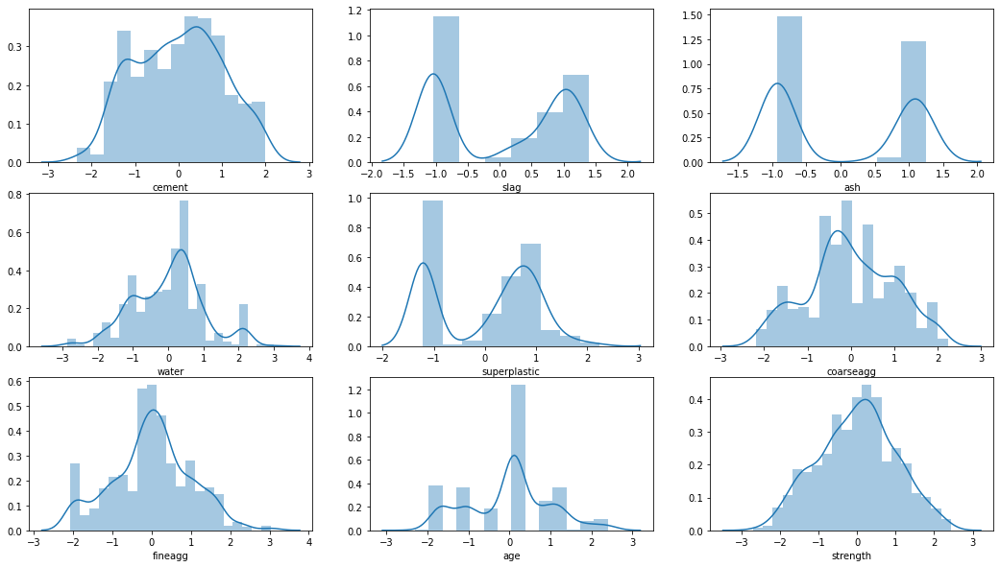

In [48]:
fig, axes = plt.subplots(3, 3, figsize=(18, 10))
sns.distplot(df1['cement'], ax=axes[0,0])
sns.distplot(df1['slag'],ax=axes[0,1])
sns.distplot(df1['ash'], ax=axes[0,2])
sns.distplot(df1['water'], ax=axes[1,0])
sns.distplot(df1['superplastic'], ax=axes[1,1])
sns.distplot(df1['coarseagg'], ax=axes[1,2])
sns.distplot(df1['fineagg'], ax=axes[2,0])
sns.distplot(df1['age'], ax=axes[2,1])
sns.distplot(df1['strength'], ax=axes[2,2])

### Observation: 
#### 1. Most of the predictors were made Gaussian like. 
#### 2. slag, ash and superplastic remained multi-modal. 
#### 3. It may further help to discretize the multi-modal data into Quantiles. 
### Since we are getting close to 90% score on training and testing data, the model is already well-fit. 